Groundwater data: NEON (National Ecological Observatory Network). Elevation of groundwater (DP1.20100.001), RELEASE-2025. https://doi.org/10.48443/ndqs-6292. Dataset accessed from https://data.neonscience.org/data-products/DP1.20100.001/RELEASE-2025 on April 14, 2025.


In [148]:
import os
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from scipy.stats import linregress
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

import warnings

warnings.filterwarnings("ignore", category=FutureWarning, message=".*use_inf_as_na.*")


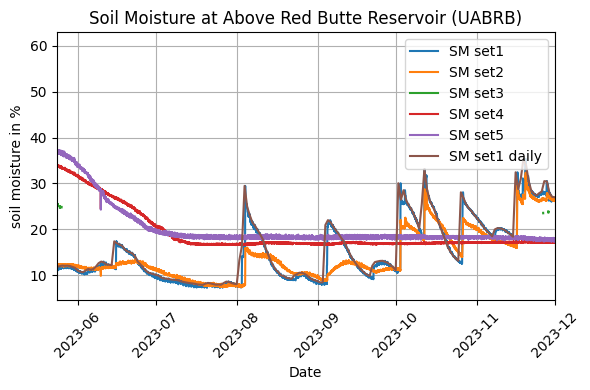

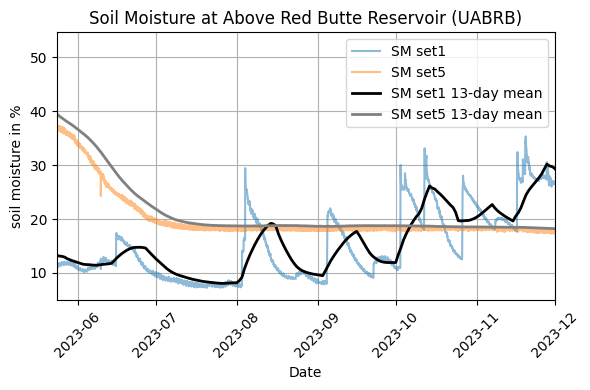

In [149]:

# Reading the discharge data from a CSV file (replace 'your_data_file.csv' with the actual file path)
SMdata = pd.read_csv('water_data/SM-UABRB.2023-12-31.csv',header=10, skiprows=[11])

# Convert the 'datetime' column to a datetime object for proper plotting
SMdata['datetime'] = pd.to_datetime(SMdata['Date_Time'], errors='coerce',)
SMdata_daily = SMdata.resample('D', on='datetime').max()

SMdata_smooth_set1 = SMdata_daily['soil_moisture_set_1'].rolling(window=13, center=False).mean()
SMdata_smooth_set5 = SMdata_daily['soil_moisture_set_5'].rolling(window=13, center=False).mean()

# Optionally, reset index if needed
SMdata_daily = SMdata_daily.reset_index()


# Plot the discharge data
plt.figure(figsize=(6, 4))
plt.plot(SMdata['datetime'],SMdata['soil_moisture_set_1'] , label='SM set1')
plt.plot(SMdata['datetime'],SMdata['soil_moisture_set_2'] , label='SM set2')
plt.plot(SMdata['datetime'],SMdata['soil_moisture_set_3'] , label='SM set3')
plt.plot(SMdata['datetime'],SMdata['soil_moisture_set_4'] , label='SM set4')
plt.plot(SMdata['datetime'],SMdata['soil_moisture_set_5'] , label='SM set5')
plt.plot(SMdata_daily['datetime'],SMdata_daily['soil_moisture_set_1'] , label='SM set1 daily')

plt.xlabel('Date')
plt.ylabel('soil moisture in %')
plt.title('Soil Moisture at Above Red Butte Reservoir (UABRB)')
plt.xticks(rotation=45)
plt.xlim(pd.to_datetime('2023-05-24'), pd.to_datetime('2023-12-01'))

plt.grid(True)
plt.tight_layout()
plt.legend(loc='upper right')
plt.show()

plt.figure(figsize=(6, 4))
plt.plot(SMdata['datetime'],SMdata['soil_moisture_set_1'] , label='SM set1',alpha=0.5)
plt.plot(SMdata['datetime'],SMdata['soil_moisture_set_5'] , label='SM set5',alpha=0.5)
plt.plot(SMdata_daily['datetime'],SMdata_smooth_set1, label='SM set1 13-day mean', color='black', linewidth=2)
plt.plot(SMdata_daily['datetime'],SMdata_smooth_set5, label='SM set5 13-day mean', color='grey', linewidth=2)
plt.xlabel('Date')
plt.ylabel('soil moisture in %')
plt.title('Soil Moisture at Above Red Butte Reservoir (UABRB)')
plt.xticks(rotation=45)
plt.xlim(pd.to_datetime('2023-05-24'), pd.to_datetime('2023-12-01'))

plt.grid(True)
plt.tight_layout()
plt.legend(loc='upper right')
plt.show()

SMoutpd=pd.DataFrame()
SMoutpd['datetime'] = SMdata_daily['datetime']
SMoutpd['Daily_sm_set1'] = SMdata_daily['soil_moisture_set_1']
SMoutpd['Daily_sm_set5'] = SMdata_daily['soil_moisture_set_5']
SMoutpd['13D_sm_set1'] = SMdata_smooth_set1.reset_index(drop=True)
SMoutpd['13D_sm_set5'] = SMdata_smooth_set5.reset_index(drop=True)
SMoutpd.to_csv('water_data/Smooth_SM-UABRB.csv', index=False, float_format='%.4f')



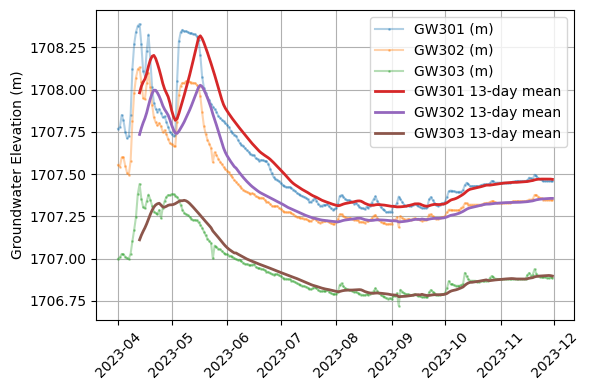

In [150]:
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Read CSV
GWdata = pd.read_csv('NEON_groundwater_elevations_2023.csv')
# Step 2: datetime
GWdata['datetime'] = pd.to_datetime(GWdata['datetime']).dt.tz_localize(None)
# Step 3: Drop any remaining NaT rows just in case
GWdata = GWdata.dropna(subset=['datetime'])
GW301_smooth = GWdata['301_gw_elev'].rolling(window=13, center=False).mean()
GW302_smooth = GWdata['302_gw_elev'].rolling(window=13, center=False).mean()
GW303_smooth = GWdata['303_gw_elev'].rolling(window=13, center=False).mean()


# Step 7: Plot
plt.figure(figsize=(6, 4))
plt.plot( GWdata['datetime'],GWdata['301_gw_elev'], label='GW301 (m)', marker='.', markersize=2, linestyle='-', alpha=0.35)
plt.plot( GWdata['datetime'],GWdata['302_gw_elev'], label='GW302 (m)', marker='.', markersize=2, linestyle='-', alpha=0.35)
plt.plot( GWdata['datetime'],GWdata['303_gw_elev'], label='GW303 (m)', marker='.', markersize=2, linestyle='-', alpha=0.35)

plt.plot(GWdata['datetime'], GW301_smooth, label='GW301 13-day mean', linewidth=2)
plt.plot(GWdata['datetime'], GW302_smooth, label='GW302 13-day mean', linewidth=2)
plt.plot(GWdata['datetime'], GW303_smooth, label='GW303 13-day mean', linewidth=2)

plt.ylabel('Groundwater Elevation (m)')
plt.xticks(rotation=45)
# plt.xlim(pd.to_datetime('2023-05-24'), pd.to_datetime('2023-12-01'))

plt.grid(True)
plt.tight_layout()
plt.legend(loc='upper right')
plt.show()

GWoutpd=pd.DataFrame()
GWoutpd['datetime'] = GWdata['datetime']
GWoutpd['301_gw_elev'] = GWdata['301_gw_elev']
GWoutpd['302_gw_elev'] = GWdata['302_gw_elev']
GWoutpd['303_gw_elev'] = GWdata['303_gw_elev']
GWoutpd['13D_smooth_GW301_m'] = GW301_smooth
GWoutpd['13D_smooth_GW302_m'] = GW302_smooth
GWoutpd['13D_smooth_GW303_m'] = GW303_smooth
GWoutpd.to_csv('water_data/Smooth_NEON-GW.csv', index=False, float_format='%.4f')


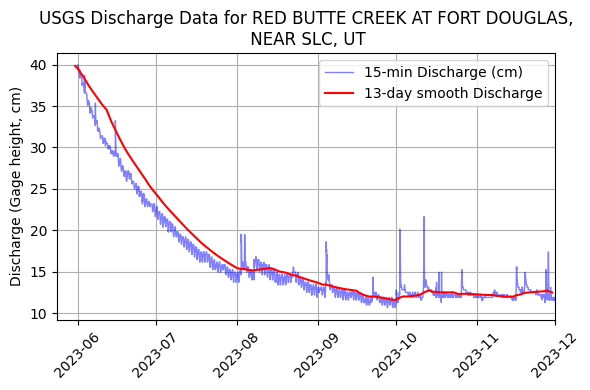

In [151]:

# Reading the discharge data from a CSV file (replace 'your_data_file.csv' with the actual file path)
data15min = pd.read_csv('water_data/USGS_10172200.csv', delimiter='\t', header=26, skiprows=[27])
data15min = data15min.dropna(subset=['datetime'])

# Convert the 'datetime' column to a datetime object for proper plotting
data15min['datetime'] = pd.to_datetime(data15min['datetime'], errors='coerce')
data15min['Discharge_ft']=data15min['144407_00065']
data15min['Discharge_cm']=data15min['144407_00065']*30.48

ds_day = data15min.resample('D', on='datetime').mean(numeric_only=True,)
ds_day = ds_day.reset_index()

# Resample to daily average
DSsmooth = ds_day['Discharge_cm'].rolling(window=13, center=False, min_periods=1).mean()

# Plot the discharge data
plt.figure(figsize=(6, 4))
plt.plot(data15min['datetime'],data15min['Discharge_cm'] , label='15-min Discharge (cm)', color='blue', alpha=0.5, linewidth=1)  
plt.plot(ds_day['datetime'],DSsmooth , label='13-day smooth Discharge', color='red', )
# plt.xlabel('Time')
plt.ylabel('Discharge (Gage height, cm)')
plt.title(f'USGS Discharge Data for RED BUTTE CREEK AT FORT DOUGLAS,\n NEAR SLC, UT')
plt.xticks(rotation=45)
plt.xlim(pd.to_datetime('2023-05-24'), pd.to_datetime('2023-12-01'))
plt.grid(True)
plt.tight_layout()
plt.legend()
plt.show()

DSpd=pd.DataFrame()
DSpd['datetime'] = ds_day['datetime']
DSpd['Daily_DS_cm'] = ds_day['Discharge_cm']
DSpd['13D_smooth_DS_cm'] = DSsmooth.reset_index(drop=True)
DSpd.to_csv('water_data/Smooth_USGS-DS.csv', index=False, float_format='%.4f')



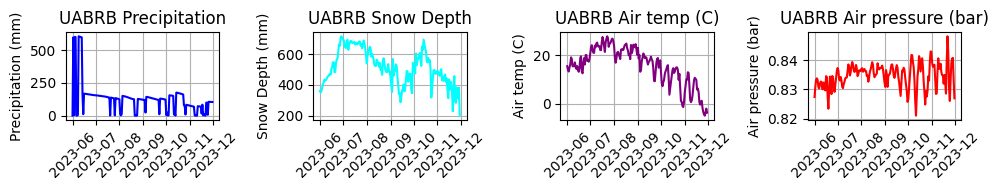

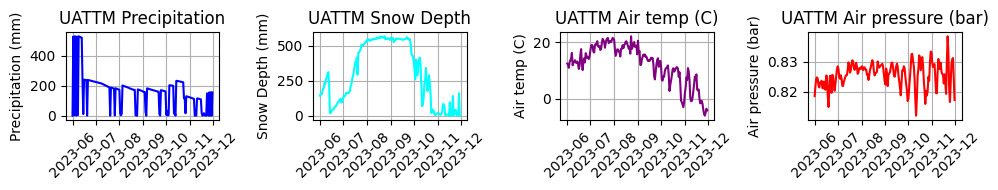

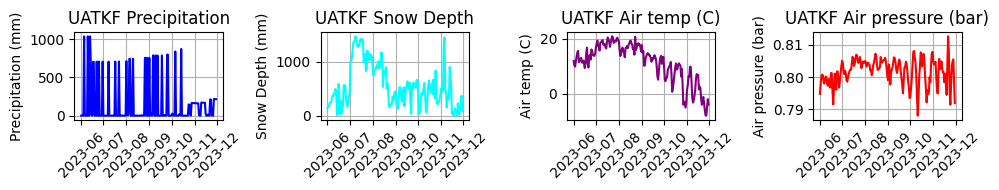

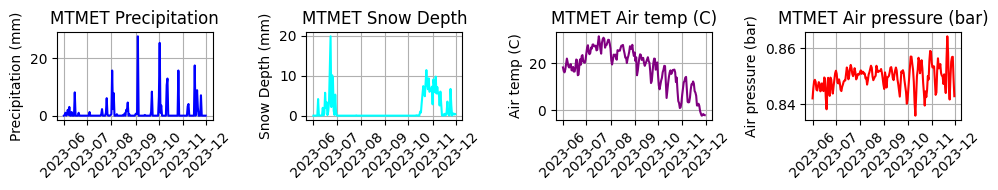

In [152]:
precip_path='mesowest_data/data/'
mesolist=["UABRB", "UATTM","UATKF","MTMET", ]

for kst, meso_st in enumerate(mesolist):
    meso_file=f'{precip_path}/{meso_st}_daily2.csv'
    meso=pd.read_csv(meso_file)
    meso['datetime']=pd.to_datetime(meso['Date_Time'])
    
    fig, ax = plt.subplots(1,4 , figsize=(10, 2))
    # fig, ax = plt.subplots(1,2 , figsize=(12, 2))
    ax[0].plot(meso['datetime'], meso['precip_daily'], label='Precipitation (mm)', color='blue')
    ax[0].set_title(str(meso_st) + ' Precipitation')
    ax[0].set_ylabel('Precipitation (mm)')
    ax[0].tick_params(axis='x', rotation=45)
    ax[0].grid(True)

    ax[1].plot(meso['datetime'], meso['snow_depth_set_1'], label='Snow Depth (mm)', color='cyan')
    ax[1].set_title(f'{mesolist[kst]} Snow Depth')
    ax[1].set_ylabel('Snow Depth (mm)')
    ax[1].tick_params(axis='x', rotation=45)
    ax[1].grid(True)

    ax[2].plot(meso['datetime'], meso['air_temp_set_1'], label='Air temp (C)', color='purple')
    ax[2].set_title(f'{mesolist[kst]} Air temp (C)')
    ax[2].set_ylabel('Air temp (C)')
    ax[2].tick_params(axis='x', rotation=45)
    ax[2].grid(True)

    ax[3].plot(meso['datetime'], meso['pressure_set_1']/100000, label='air pressure (bar)', color='red')
    ax[3].set_title(f'{mesolist[kst]} Air pressure (bar)')
    ax[3].set_ylabel('Air pressure (bar)')
    ax[3].tick_params(axis='x', rotation=45)
    ax[3].grid(True)    
    
    plt.tight_layout()

In [153]:
import glob
import numpy as np

seis_sta=pd.read_csv('redbutte_sta.csv')
seis_sta['stnm']=seis_sta['stnm'].astype(int).apply(lambda i: f"{i:03}")
seis_sta=seis_sta[:-1] 
print(seis_sta)


# output_path="Repro_fixori_prefilt_20Hz_withswap_sepa_4plot/concated/DVAVE_c2wei/ST/SC/"
output_path="Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/"
bandlist=['2-4','4-8',]

  stnm        lat         lon    elev
0  002  40.794796 -111.779490  1868.0
1  001  40.794836 -111.779309  1868.0
2  003  40.794740 -111.779110  1847.0
3  004  40.794670 -111.778810  1847.0
4  005  40.794660 -111.778630  1847.0
5  006  40.794660 -111.778400  1847.0


['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_002_002_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F4-8_002_002_F4-8_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_001_001_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F4-8_001_001_F4-8_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_003_003_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F4-8_003_003_F4-8_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_004_004_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F4-8_004_004_F4-8_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_005_005_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F4-8_005_005_F4-8_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_006_006_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2w

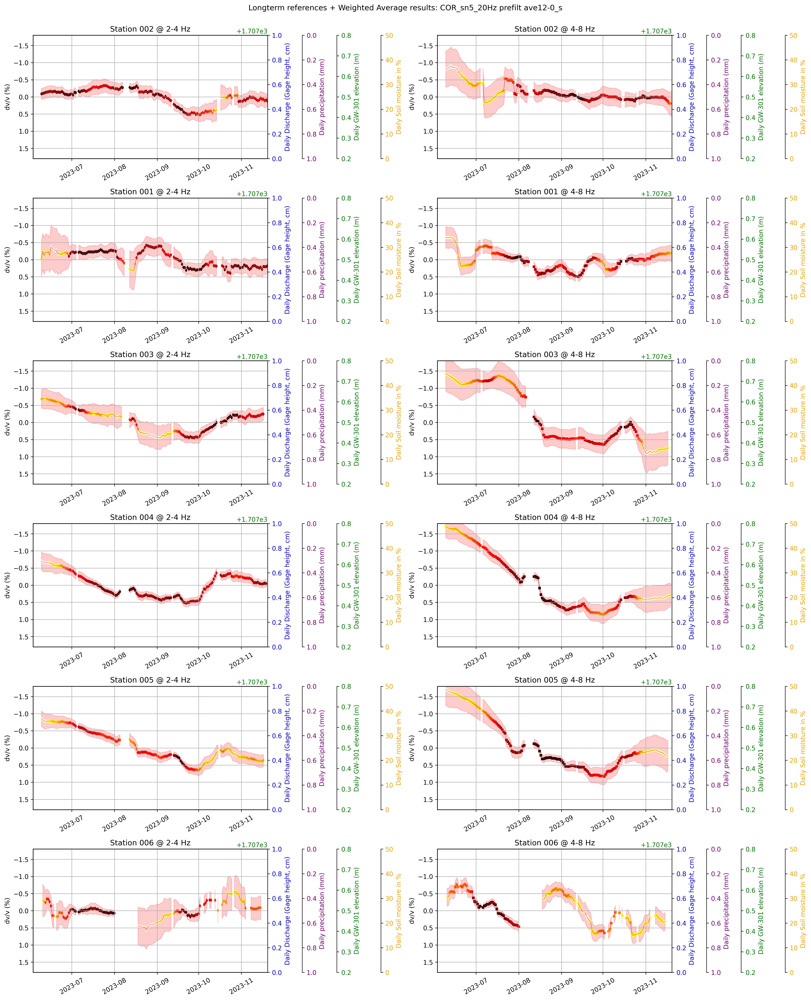

In [154]:
symb=["d","s","x","^","v"]
fig, ax=plt.subplots(6,2,figsize=(18,22), dpi=300)

fig.suptitle('Longterm references + Weighted Average results: COR_sn5_20Hz prefilt ave12-0_s', 
             fontsize=12, y=1.0001 )
for nst, stnm in enumerate(seis_sta['stnm']):

    for fk, fband in enumerate(bandlist):
        # print(f"Station: {stnm}, Band: {fband}")
        fn_pattern=f'{output_path}/dv_ave_*_{stnm}_*_F{fband}*.out'
        fn=glob.glob(fn_pattern)
        print(fn)
        pd_dv = pd.read_csv(
            fn[0], 
            sep='\s+', 
            names=['dv', 'err', 'date', 'sta1', 'sta2', 'jday'], 
            skiprows=0
        )
        pd_dv['dv']=pd_dv['dv']*100
        pd_dv['err']=pd_dv['err']*100
        
        # Convert the 'date' column to datetime
        pd_dv['date'] = pd.to_datetime(pd_dv['date'], format='%Y%m%d')

        # # Optional: Format for plotting (e.g., only year-month-day as a string)
        # pd_dv['formatted_date'] = pd_dv['date'].dt.strftime('%Y-%m-%d')

        date_diffs = pd_dv['date'].diff().dt.days

        # Mark where the gap is more than 1 day
        gap_indices = date_diffs > 1

        # Assign group numbers to each continuous segment
        group = gap_indices.cumsum()

        # Loop over each group (continuous chunk) and plot
        for g in group.unique():
            chunk = pd_dv[group == g]
            
            ax[nst,fk].plot(
                chunk['date'], chunk['dv'], 
                color='red', lw=0.5, alpha=0.8
            )
            
            ax[nst,fk].fill_between(
                chunk['date'], 
                chunk['dv'] - chunk['err'], 
                chunk['dv'] + chunk['err'], 
                color='red', alpha=0.2
            )

        # ax[nst,fk].plot(pd_dv['date'], pd_dv['dv'], color='red', lw=0.5, label=f'swap & middle-stack\nweighted Average', alpha=0.8)
        # ax[nst,fk].fill_between(pd_dv.date, (pd_dv.dv - pd_dv.err), (pd_dv.dv + pd_dv.err) , color='red', alpha=0.2)

        # Plotting with error as color
        scatter = ax[nst,fk].scatter(
            pd_dv['date'], pd_dv['dv'], 
            c=pd_dv['err'], 
            cmap='hot',  # Color map for the error
            edgecolor=None,   # Black edge around circles
            # linestyle='-',   # Solid line
            s=10,           # Size of the markers
            marker=symb[fk],     # Marker shape
            label=f'{fband} Hz'
        )        


        ymax=np.abs(pd_dv['dv']).max()
        ax[nst,fk].set_ylim(1.8,-1.8)
        ax[nst,fk].set_xlim(pd.to_datetime("2023-06-03 00:00:00"), pd.to_datetime("2023-11-20 00:00:00"))
        # ax[nst,fk].plot(data15min['datetime'],  data15min['Discharge'] , label='Reversed Discharge (cfs)', color='blue')
        # Adding labels and legend
        # ax[nst,fk].set_xlabel('Time')
        ax[nst,fk].set_ylabel('dv/v (%)')
        ax[nst,fk].set_title(f'Station {stnm} @ {fband} Hz')
        ax[nst,fk].grid(True)
        ax[nst,fk].tick_params(axis='x', rotation=30)
        
        # cbar = fig.colorbar(scatter, ax=ax[nst,fk], orientation='horizontal', fraction=0.05, pad=0.3, )
        # cbar.set_label('Error in %',)  # Fine-tune label placement
        # Create a secondary y-axis for discharge

        ax2 = ax[nst, fk].twinx()

        ax2.set_ylabel('Daily Discharge (Gage height, cm)', color='blue')
        ax2.tick_params(axis='y', labelcolor='blue')
        
        ax3 = ax[nst, fk].twinx()

        ax3.set_ylabel('Daily precipitation (mm)', color='purple')
        ax3.invert_yaxis()
        ax3.tick_params(axis='y', labelcolor='purple')
        ax3.spines['right'].set_position(('outward', 55))
        
        ax4 = ax[nst, fk].twinx()
        ax4.set_ylim(1707.2,1707.8)

        ax4.set_ylabel('Daily GW-301 elevation (m)', color='green')
        ax4.tick_params(axis='y', labelcolor='green')
        ax4.spines['right'].set_position(('outward', 110))

        ax5 = ax[nst, fk].twinx()
        ax5.set_ylim(0,50)

        ax5.set_ylabel('Daily Soil moisture in %', color='orange')
        ax5.tick_params(axis='y', labelcolor='orange')
        ax5.spines['right'].set_position(('outward', 180))        

    plt.tight_layout()
plt.show()


['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_002_002_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F4-8_002_002_F4-8_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_001_001_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F4-8_001_001_F4-8_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_003_003_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F4-8_003_003_F4-8_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_004_004_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F4-8_004_004_F4-8_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_005_005_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F4-8_005_005_F4-8_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_006_006_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2w

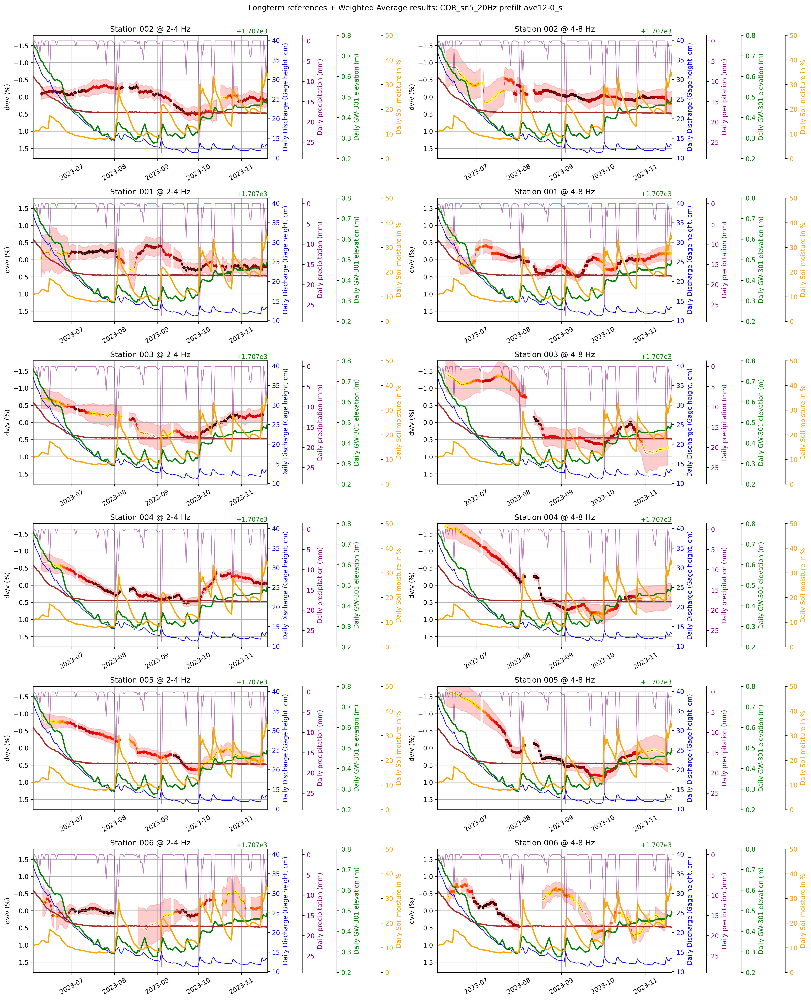

In [155]:
symb=["d","s","x","^","v"]
fig, ax=plt.subplots(6,2,figsize=(18,22), dpi=300)

fig.suptitle('Longterm references + Weighted Average results: COR_sn5_20Hz prefilt ave12-0_s', 
             fontsize=12, y=1.0001 )
for nst, stnm in enumerate(seis_sta['stnm']):

    for fk, fband in enumerate(bandlist):
        # print(f"Station: {stnm}, Band: {fband}")
        fn_pattern=f'{output_path}/dv_ave_*_{stnm}_*_F{fband}*.out'
        fn=glob.glob(fn_pattern)
        print(fn)
        pd_dv = pd.read_csv(
            fn[0], 
            sep='\s+', 
            names=['dv', 'err', 'date', 'sta1', 'sta2', 'jday'], 
            skiprows=0
        )
        pd_dv['dv']=pd_dv['dv']*100
        pd_dv['err']=pd_dv['err']*100
        
        # Convert the 'date' column to datetime
        pd_dv['date'] = pd.to_datetime(pd_dv['date'], format='%Y%m%d')

        # # Optional: Format for plotting (e.g., only year-month-day as a string)
        # pd_dv['formatted_date'] = pd_dv['date'].dt.strftime('%Y-%m-%d')

        date_diffs = pd_dv['date'].diff().dt.days

        # Mark where the gap is more than 1 day
        gap_indices = date_diffs > 1

        # Assign group numbers to each continuous segment
        group = gap_indices.cumsum()

        # Loop over each group (continuous chunk) and plot
        for g in group.unique():
            chunk = pd_dv[group == g]
            
            ax[nst,fk].plot(
                chunk['date'], chunk['dv'], 
                color='red', lw=0.5, alpha=0.8
            )
            
            ax[nst,fk].fill_between(
                chunk['date'], 
                chunk['dv'] - chunk['err'], 
                chunk['dv'] + chunk['err'], 
                color='red', alpha=0.2
            )

        # ax[nst,fk].plot(pd_dv['date'], pd_dv['dv'], color='red', lw=0.5, label=f'swap & middle-stack\nweighted Average', alpha=0.8)
        # ax[nst,fk].fill_between(pd_dv.date, (pd_dv.dv - pd_dv.err), (pd_dv.dv + pd_dv.err) , color='red', alpha=0.2)

        # Plotting with error as color
        scatter = ax[nst,fk].scatter(
            pd_dv['date'], pd_dv['dv'], 
            c=pd_dv['err'], 
            cmap='hot',  # Color map for the error
            edgecolor=None,   # Black edge around circles
            # linestyle='-',   # Solid line
            s=10,           # Size of the markers
            marker=symb[fk],     # Marker shape
            label=f'{fband} Hz'
        )        


        ymax=np.abs(pd_dv['dv']).max()
        ax[nst,fk].set_ylim(1.8,-1.8)
        ax[nst,fk].set_xlim(pd.to_datetime("2023-06-03 00:00:00"), pd.to_datetime("2023-11-20 00:00:00"))
        # ax[nst,fk].plot(data15min['datetime'],  data15min['Discharge'] , label='Reversed Discharge (cfs)', color='blue')
        # Adding labels and legend
        # ax[nst,fk].set_xlabel('Time')
        ax[nst,fk].set_ylabel('dv/v (%)')
        ax[nst,fk].set_title(f'Station {stnm} @ {fband} Hz')
        ax[nst,fk].grid(True)
        ax[nst,fk].tick_params(axis='x', rotation=30)
        
        # cbar = fig.colorbar(scatter, ax=ax[nst,fk], orientation='horizontal', fraction=0.05, pad=0.3, )
        # cbar.set_label('Error in %',)  # Fine-tune label placement
        # Create a secondary y-axis for discharge

        ax2 = ax[nst, fk].twinx()
        ax2.plot(
            DSpd['datetime'], 
            DSpd['Daily_DS_cm'], 
            label='Reversed Discharge (cm)', 
            color='blue', 
            linestyle='-',
            linewidth=1
        )
        ax2.set_ylabel('Daily Discharge (Gage height, cm)', color='blue')
        ax2.tick_params(axis='y', labelcolor='blue')
        
        ax3 = ax[nst, fk].twinx()
        ax3.plot(meso['datetime'], meso['precip_daily'],
            label='Daily precipitation (mm)', 
            color='purple', 
            linestyle='-',
            linewidth=1,
            alpha=0.5
        )
        ax3.set_ylabel('Daily precipitation (mm)', color='purple')
        ax3.invert_yaxis()
        ax3.tick_params(axis='y', labelcolor='purple')
        ax3.spines['right'].set_position(('outward', 55))
        
        ax4 = ax[nst, fk].twinx()
        ax4.set_ylim(1707.2,1707.8)
        ax4.plot(
            GWdata['datetime'], GWdata['301_gw_elev'], label='Daily GW301 elevation (m)', 
            color='green', 
            linestyle='-',
            linewidth=2,
        )
        ax4.set_ylabel('Daily GW-301 elevation (m)', color='green')
        ax4.tick_params(axis='y', labelcolor='green')
        ax4.spines['right'].set_position(('outward', 110))

        ax5 = ax[nst, fk].twinx()
        ax5.set_ylim(0,50)
        ax5.plot(SMoutpd['datetime'],SMoutpd['Daily_sm_set5'],
            color='brown', 
            linestyle='-',
            linewidth=2,
        )
        ax5.plot(
            SMoutpd['datetime'],SMoutpd['Daily_sm_set1'],
            color='orange', 
            linestyle='-',
            linewidth=2,
        )
        ax5.set_ylabel('Daily Soil moisture in %', color='orange')
        ax5.tick_params(axis='y', labelcolor='orange')
        ax5.spines['right'].set_position(('outward', 180))        

    plt.tight_layout()
plt.show()


['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_002_002_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F4-8_002_002_F4-8_R0.out']


['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_001_001_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F4-8_001_001_F4-8_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_003_003_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F4-8_003_003_F4-8_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_004_004_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F4-8_004_004_F4-8_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_005_005_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F4-8_005_005_F4-8_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F2-4_006_006_F2-4_R0.out']
['Results_prefilt_20Hz/DVAVE_c2wei/ST/SC/dv_ave_COR_sn5_20Hz_F4-8_006_006_F4-8_R0.out']


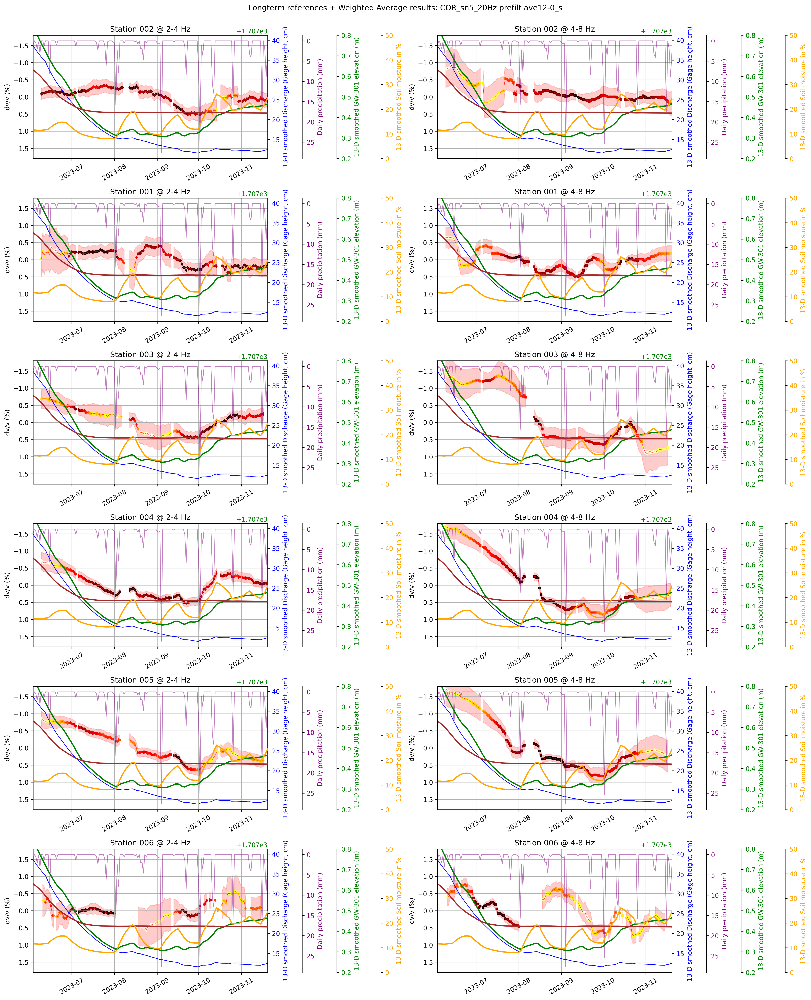

In [156]:
symb=["d","s","x","^","v"]
fig, ax=plt.subplots(6,2,figsize=(18,22), dpi=300)

fig.suptitle('Longterm references + Weighted Average results: COR_sn5_20Hz prefilt ave12-0_s', 
             fontsize=12, y=1.0001 )
for nst, stnm in enumerate(seis_sta['stnm']):

    for fk, fband in enumerate(bandlist):
        # print(f"Station: {stnm}, Band: {fband}")
        fn_pattern=f'{output_path}/dv_ave_*_{stnm}_*_F{fband}*.out'
        fn=glob.glob(fn_pattern)
        print(fn)
        pd_dv = pd.read_csv(
            fn[0], 
            sep='\s+', 
            names=['dv', 'err', 'date', 'sta1', 'sta2', 'jday'], 
            skiprows=0
        )
        pd_dv['dv']=pd_dv['dv']*100
        pd_dv['err']=pd_dv['err']*100
        
        # Convert the 'date' column to datetime
        pd_dv['date'] = pd.to_datetime(pd_dv['date'], format='%Y%m%d')

        # # Optional: Format for plotting (e.g., only year-month-day as a string)
        # pd_dv['formatted_date'] = pd_dv['date'].dt.strftime('%Y-%m-%d')

        date_diffs = pd_dv['date'].diff().dt.days

        # Mark where the gap is more than 1 day
        gap_indices = date_diffs > 1

        # Assign group numbers to each continuous segment
        group = gap_indices.cumsum()

        # Loop over each group (continuous chunk) and plot
        for g in group.unique():
            chunk = pd_dv[group == g]
            
            ax[nst,fk].plot(
                chunk['date'], chunk['dv'], 
                color='red', lw=0.5, alpha=0.8
            )
            
            ax[nst,fk].fill_between(
                chunk['date'], 
                chunk['dv'] - chunk['err'], 
                chunk['dv'] + chunk['err'], 
                color='red', alpha=0.2
            )

        # ax[nst,fk].plot(pd_dv['date'], pd_dv['dv'], color='red', lw=0.5, label=f'swap & middle-stack\nweighted Average', alpha=0.8)
        # ax[nst,fk].fill_between(pd_dv.date, (pd_dv.dv - pd_dv.err), (pd_dv.dv + pd_dv.err) , color='red', alpha=0.2)

        # Plotting with error as color
        scatter = ax[nst,fk].scatter(
            pd_dv['date'], pd_dv['dv'], 
            c=pd_dv['err'], 
            cmap='hot',  # Color map for the error
            edgecolor=None,   # Black edge around circles
            # linestyle='-',   # Solid line
            s=10,           # Size of the markers
            marker=symb[fk],     # Marker shape
            label=f'{fband} Hz'
        )        


        ymax=np.abs(pd_dv['dv']).max()
        ax[nst,fk].set_ylim(1.8,-1.8)
        ax[nst,fk].set_xlim(pd.to_datetime("2023-06-03 00:00:00"), pd.to_datetime("2023-11-20 00:00:00"))
        # ax[nst,fk].plot(data15min['datetime'],  data15min['Discharge'] , label='Reversed Discharge (cfs)', color='blue')
        # Adding labels and legend
        # ax[nst,fk].set_xlabel('Time')
        ax[nst,fk].set_ylabel('dv/v (%)')
        ax[nst,fk].set_title(f'Station {stnm} @ {fband} Hz')
        ax[nst,fk].grid(True)
        ax[nst,fk].tick_params(axis='x', rotation=30)
        
        # cbar = fig.colorbar(scatter, ax=ax[nst,fk], orientation='horizontal', fraction=0.05, pad=0.3, )
        # cbar.set_label('Error in %',)  # Fine-tune label placement
        # Create a secondary y-axis for discharge

        ax2 = ax[nst, fk].twinx()
        ax2.plot(
            DSpd['datetime'], 
            DSpd['13D_smooth_DS_cm'], 
            label='Reversed Discharge (cm)', 
            color='blue', 
            linestyle='-',
            linewidth=1
        )
        ax2.set_ylabel('13-D smoothed Discharge (Gage height, cm)', color='blue')
        ax2.tick_params(axis='y', labelcolor='blue')
        
        ax3 = ax[nst, fk].twinx()
        ax3.plot(meso['datetime'], meso['precip_daily'],
            label='Daily precipitation (mm)', 
            color='purple', 
            linestyle='-',
            linewidth=1,
            alpha=0.5
        )
        ax3.set_ylabel('Daily precipitation (mm)', color='purple')
        ax3.invert_yaxis()
        ax3.tick_params(axis='y', labelcolor='purple')
        ax3.spines['right'].set_position(('outward', 55))
        
        ax4 = ax[nst, fk].twinx()
        ax4.set_ylim(1707.2,1707.8)
        ax4.plot(
            GWoutpd['datetime'], GWoutpd['13D_smooth_GW301_m'], label='13-D GW301 elevation (m)', 
            color='green', 
            linestyle='-',
            linewidth=2,
        )
        ax4.set_ylabel('13-D smoothed GW-301 elevation (m)', color='green')
        ax4.tick_params(axis='y', labelcolor='green')
        ax4.spines['right'].set_position(('outward', 110))

        ax5 = ax[nst, fk].twinx()
        ax5.set_ylim(0,50)
        ax5.plot(SMoutpd['datetime'],SMoutpd['13D_sm_set5'],
            color='brown', 
            linestyle='-',
            linewidth=2,
        )
        ax5.plot(
            SMoutpd['datetime'],SMoutpd['13D_sm_set1'],
            color='orange', 
            linestyle='-',
            linewidth=2,
        )
        ax5.set_ylabel('13-D smoothed Soil moisture in %', color='orange')
        ax5.tick_params(axis='y', labelcolor='orange')
        ax5.spines['right'].set_position(('outward', 180))        

    plt.tight_layout()
plt.show()


In [160]:
cutbt=pd.to_datetime("2023-06-08")
cutet=pd.to_datetime("2023-11-20")

smtmp = SMoutpd.copy()
gwtmp = GWoutpd.copy()
dstmp = DSpd.copy()

# Make sure all datetime columns are aligned (timezone-free)
smtmp['datetime'] = pd.to_datetime(smtmp['datetime']).dt.tz_localize(None)
dstmp['datetime'] = pd.to_datetime(dstmp['datetime']).dt.tz_localize(None)
gwtmp['datetime'] = pd.to_datetime(gwtmp['datetime']).dt.tz_localize(None)

# Filter the dataframes based on the cutbt and cutet
smtmp = smtmp.loc[(smtmp['datetime'] >= cutbt) & (smtmp['datetime'] <= cutet)]
gwtmp = gwtmp.loc[(gwtmp['datetime'] >= cutbt) & (gwtmp['datetime'] <= cutet)]
dstmp = dstmp.loc[(DSpd['datetime'] >= cutbt) & (dstmp['datetime'] <= cutet)]
pttmp = meso.loc[(meso['datetime'] >= cutbt) & (meso['datetime'] <= cutet)]
pttmp = pttmp[['datetime']]
pttmp['Daily_precip_mm']=meso['precip_daily']


In [161]:
df_merged = dstmp.copy()
# Merge each hydrological dataset on datetime
df_merged = df_merged.merge(smtmp, on='datetime', how='left')
df_merged = df_merged.merge(gwtmp, on='datetime', how='left')
df_merged = df_merged.merge(pttmp, on='datetime', how='left')
# Export
df_merged.to_csv('final_combine_data.csv', index=False, float_format='%.4f')
df_merged

,datetime,Daily_DS_cm,13D_smooth_DS_cm,Daily_sm_set1,Daily_sm_set5,13D_sm_set1,13D_sm_set5,301_gw_elev,302_gw_elev,303_gw_elev,13D_smooth_GW301_m,13D_smooth_GW302_m,13D_smooth_GW303_m,Daily_precip_mm
0,2023-06-08,32.664400,36.209817,11.90,29.88,11.439231,33.539231,1707.6860,1707.4302,1706.9940,1707.772277,1707.507462,1707.021515,3.05
1,2023-06-09,31.686500,35.757485,12.62,29.14,11.483077,32.953846,1707.6733,1707.4177,1706.9840,1707.759023,1707.494015,1707.015746,0.00
2,2023-06-10,31.054675,35.329957,12.97,28.36,11.552308,32.345385,1707.6692,1707.4083,1706.9754,1707.746346,1707.481238,1707.009638,0.00
3,2023-06-11,30.670500,34.941669,12.79,27.40,11.613077,31.690769,1707.6529,1707.3990,1706.9688,1707.733223,1707.468869,1707.003715,1.27
4,2023-06-12,30.216475,34.578192,12.37,26.62,11.656923,31.003846,1707.6421,1707.3958,1706.9673,1707.720115,1707.457469,1706.998446,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161,2023-11-16,13.639800,12.121906,32.43,18.46,20.513846,18.470769,1707.4631,1707.3444,1706.9033,1707.456777,1707.337600,1706.881792,17.52
162,2023-11-17,12.877800,12.197862,28.76,18.48,21.163077,18.472308,1707.4796,1707.3500,1706.9156,1707.459054,1707.339138,1706.884531,0.00
163,2023-11-18,12.728575,12.262583,31.09,18.46,22.046923,18.467692,1707.4750,1707.3500,1706.9000,1707.460977,1707.340677,1706.886069,2.03
164,2023-11-19,13.484225,12.385431,35.35,18.44,23.299231,18.459231,1707.4704,1707.3519,1706.9050,1707.462546,1707.342362,1706.887992,8.89
